# Using Lime with Pytorch

In this tutorial we will show how to use Lime framework with Pytorch. Specifically, we will use Lime to explain the prediction generated by one of the pretrained ImageNet models.

Let's start with importing our dependencies. This code is tested with Pytorch 1.0 but should work with older versions as well.

In [54]:
import matplotlib.pyplot as plt
from PIL import Image
import torch.nn as nn
import numpy as np
import os, json

import torch
from torchvision import models, transforms
from torch.autograd import Variable
import torch.nn.functional as F
import pandas as pd

from torchvision.models import resnet18, ResNet18_Weights
import pytorch_lightning as pl
from collections import defaultdict, OrderedDict
from torch.utils.data import DataLoader, random_split, Dataset

Load our test image and see how it looks.

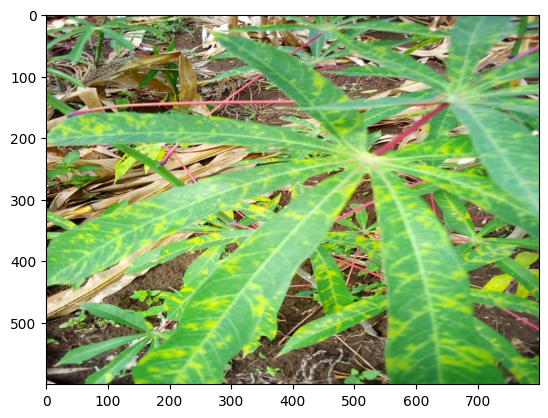

In [46]:
def get_image(path):
    with open(os.path.abspath(path), 'rb') as f:
        with Image.open(f) as img:
            return img.convert('RGB') 
        
img = get_image('./cassava/images/218377.jpg')
plt.imshow(img)
plt.show()

We need to convert this image to Pytorch tensor and also apply whitening as used by our pretrained model.

In [47]:
# resize and take the center part of image to what our model expects
def get_input_transform():
    """
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])       
    transf = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        normalize
    ])
    """

    return ResNet18_Weights.IMAGENET1K_V1.transforms()

def get_input_tensors(img):
    transf = get_input_transform()
    # unsqeeze converts single image to batch of 1
    return transf(img).unsqueeze(0)

In [4]:
!wget --content-disposition "https://github.com/NeoLafuente/cassava/releases/download/v1.0.0/cassava_resnet18_geo_photo_aug_dropout_fixed_epoch.8-val_loss.0.82.ckpt"

--2025-11-19 17:28:25--  https://github.com/NeoLafuente/cassava/releases/download/v1.0.0/cassava_resnet18_geo_photo_aug_dropout_fixed_epoch.8-val_loss.0.82.ckpt
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/1093614103/4e54a50b-0015-4fed-9a05-55c74cd73aa9?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-11-19T17%3A02%3A13Z&rscd=attachment%3B+filename%3Dcassava_resnet18_geo_photo_aug_dropout_fixed_epoch.8-val_loss.0.82.ckpt&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-11-19T16%3A01%3A37Z&ske=2025-11-19T17%3A02%3A13Z&sks=b&skv=2018-11-09&sig=m7xMawW6bM7f1O13TVpvkkDm%2F90g%2BUiQkZjCXZnWb8c%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlb

Load the pretrained model for Resnet50 available in Pytorch.

In [48]:
class LightningModule(pl.LightningModule):
    def __init__(self, model, lr=1e-3, wd=0.):
        super().__init__()
        self.model = model
        self.lr = lr
        self.wd = wd

        self.training_step_outputs = defaultdict(float)
        self.validation_step_outputs = defaultdict(float)

    def forward(self, x):
        return self.model(x)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.lr)
        
        # Configure ReduceLROnPlateau scheduler
        scheduler = ReduceLROnPlateau(
            optimizer,
            mode='min',           # Minimize the monitored metric
            factor=0.1,          # Multiply LR by this factor when reducing
            patience=5,          # Number of epochs with no improvement before reducing LR
            threshold=0.01,      # Threshold for measuring improvement
            threshold_mode='rel', # 'rel' for relative change, 'abs' for absolute
            cooldown=0,          # Number of epochs to wait before resuming normal operation
            min_lr=1e-6,         # Lower bound on the learning rate
            eps=1e-8             # Minimal decay applied to lr
        )
        
        return {
            'optimizer': optimizer,
            'lr_scheduler': {
                'scheduler': scheduler,
                'monitor': 'val_loss',  # Metric to monitor
                'interval': 'epoch',     # Update scheduler after each epoch
                'frequency': 1,          # Check metric every epoch
                'strict': True,          # Enforce that monitored metric exists
            }
        }

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits, y)
        self.log('train_loss', loss, on_step=False, on_epoch=True)
        
        self.training_step_outputs['loss'] += loss.detach().cpu()
        self.training_step_outputs['steps'] += 1
            
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits, y)
        self.log('val_loss', loss, on_step=False, on_epoch=True)

        self.validation_step_outputs['loss'] += loss.detach().cpu()
        self.validation_step_outputs['steps'] += 1
        
        return loss

    def on_train_epoch_end(self): 
        avg_loss = self.training_step_outputs['loss'] / self.training_step_outputs['steps']
        print(f"Average training loss for epoch {self.current_epoch}: {avg_loss.item():.4f}")
        self.training_step_outputs.clear() 

    def on_validation_epoch_end(self):
        avg_loss = self.validation_step_outputs['loss'] / self.validation_step_outputs['steps']
        print(f"Average validation loss for epoch {self.current_epoch}: {avg_loss.item():.4f}")
        self.validation_step_outputs.clear()

In [49]:
class GaussianNoise:
    def __init__(self, mean=0., std=0.1):
        self.mean = mean
        self.std = std
    
    def __call__(self, img):
        noise = torch.randn(img.size()) * self.std + self.mean
        return img + noise
    
    def __repr__(self):
        return f"{self.__class__.__name__}(mean={self.mean}, std={self.std})"

In [50]:
NUM_CLASSES = 5

In [51]:
model = models.resnet18(weights='IMAGENET1K_V1')

"""
# Aplicar a todos los bloques
for layer_name in ['layer1', 'layer2', 'layer3', 'layer4']:
    layer = getattr(model, layer_name)
    for block in layer:
        add_dropout_to_basicblock(block, p=0.2)
"""

# Cambiar última capa
num_in_feat = model.fc.in_features
model.fc = nn.Linear(num_in_feat, 5)

# Freeze layers
for idx_param, param in enumerate(model.parameters()):
    param.requires_grad = False


lightning_module = LightningModule(model, lr=1e-3)

checkpoint = torch.load('cassava_resnet18_geo_photo_aug_dropout_fixed_epoch.8-val_loss.0.82.ckpt', map_location='cpu', weights_only=False)
state_dict = OrderedDict({k.replace('model.', ''):v for k,v in checkpoint['state_dict'].items()}) # Extract weights from Lightning 'model.conv1.weight' -> 'conv1.weight

lightning_module.model.load_state_dict(state_dict)
lightning_module.eval()

LightningModule(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

Load label texts for ImageNet predictions so we know what model is predicting

In [55]:
class CassavaDataset(Dataset):
    def __init__(self, csv_file, images_dir, label_map_file, set_name=None, transform=None, num_subsets=1, subset_idx=None):
        self.df = pd.read_csv(csv_file)
        
        # Filtrar por set_name si se proporciona
        if set_name:
            self.df = self.df[self.df['set'] == set_name].reset_index(drop=True)
            if set_name == 'train':
                class_3 = self.df[self.df['label'] == 3].sample(n=2000, random_state=42)
            elif set_name == 'val':
                class_3 = self.df[self.df['label'] == 3].sample(n=400, random_state=42)
            else:
                class_3 = self.df[self.df['label'] == 3]
            
            other_classes = self.df[self.df['label'] != 3]
            self.df = pd.concat([class_3, other_classes]).reset_index(drop=True)
        
        # Set seed if required
        if num_subsets > 1 and subset_idx is not None:
            # Random permutation (set seed for reproducibility)
            np.random.seed(42)
            shuffled_indices = np.random.permutation(len(self.df))
            
            # Divide the subset in num_subsets splits
            subset_splits = np.array_split(shuffled_indices, num_subsets)
            
            # Select the desired subset
            selected_indices = subset_splits[subset_idx % num_subsets]
            self.df = self.df.iloc[selected_indices].reset_index(drop=True)
        
        self.images_dir = images_dir
        self.transform = transform
        
        # Load label mapping
        with open(label_map_file, 'r') as f:
            self.label_map = json.load(f)
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        # Get info from CSV
        row = self.df.iloc[idx]
        img_name = row['image_id']
        label = row['label']
        
        # Load img
        img_path = os.path.join(self.images_dir, f'{img_name}')
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        return image, label

In [56]:
class DataModule(pl.LightningDataModule):
    def __init__(self, data_dir='cassava', batch_size=64, num_workers=2, num_subsets=7, transforms=transforms):
        super().__init__()
        self.save_hyperparameters()
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.num_subsets = num_subsets
        self.subset_idx = 0
        self.transforms = transforms
        
    def setup(self, stage=None):
        images_dir = os.path.join(self.data_dir, 'images')
        
        # Rutas a los archivos
        csv_file = os.path.join(self.data_dir, 'cassava_split.csv')
        label_map_file = os.path.join(self.data_dir, 'label_num_to_disease_map.json')
        
        # Preparar transforms
        #transform = ResNet18_Weights.IMAGENET1K_V1.transforms()
        
        # Crear datasets con el subset_idx ACTUAL
        self.train_ds = CassavaDataset(
            csv_file=csv_file,
            images_dir=images_dir,
            label_map_file=label_map_file,
            set_name='train',
            num_subsets=self.num_subsets,
            subset_idx=self.subset_idx,
            transform=self.transforms['train']
        )
        
        self.val_ds = CassavaDataset(
            csv_file=csv_file,
            images_dir=images_dir,
            label_map_file=label_map_file,
            set_name='val',
            num_subsets=1, #self.num_subsets,
            subset_idx=0, #self.subset_idx,
            transform=self.transforms['val']
        )
        
        self.test_ds = CassavaDataset(
            csv_file=csv_file,
            images_dir=images_dir,
            label_map_file=label_map_file,
            set_name='test',
            num_subsets=1,
            subset_idx=0,
            transform=self.transforms['test']
        )
    
    def train_dataloader(self):
        return DataLoader(
            self.train_ds, 
            batch_size=self.batch_size, 
            num_workers=self.num_workers,
            shuffle=True
        )
    
    def val_dataloader(self):
        return DataLoader(
            self.val_ds, 
            batch_size=self.batch_size, 
            num_workers=self.num_workers
        )
    
    def test_dataloader(self):
        return DataLoader(
            self.test_ds, 
            batch_size=self.batch_size, 
            num_workers=self.num_workers
        )

In [57]:
data_transforms = {
    'train': ResNet18_Weights.IMAGENET1K_V1.transforms(),
    'val': ResNet18_Weights.IMAGENET1K_V1.transforms(),
    'test': ResNet18_Weights.IMAGENET1K_V1.transforms()
}

data_module = DataModule(num_subsets=1, transforms=data_transforms)
data_module.setup()

In [27]:
cassava_csv = pd.read_csv('./cassava/cassava_split.csv')
with open(os.path.abspath('./cassava/label_num_to_disease_map.json'), 'r') as read_file:
    label2cls = json.load(read_file)

In [28]:
# idx2label, cls2label, cls2idx = [], {}, {}
idx2label = cassava_csv['label'].values
cls2label = {v: k for k, v in label2cls.items()}
# cls2idx = {class_idx[str(k)]: k for k in range(len(class_idx))}    

In [29]:
label2cls

{'0': 'Cassava Bacterial Blight (CBB)',
 '1': 'Cassava Brown Streak Disease (CBSD)',
 '2': 'Cassava Green Mottle (CGM)',
 '3': 'Cassava Mosaic Disease (CMD)',
 '4': 'Healthy'}

In [30]:
unique_samples = [cassava_csv[cassava_csv['label'] == k]['image_id'].iloc[0] for k in range(len(label2cls))]

Get the predicition for our image.

In [31]:
img_t = get_input_tensors(img)
lightning_module.eval() #model.eval()
#logits = model(img_t)
logits = lightning_module(img_t)

In [32]:
logits

tensor([[-2.7341,  7.7241, -4.2988, -0.0749, -6.0624]])

Predicitions we got are logits. Let's pass that through softmax to get probabilities and class labels for top 5 predictions.

In [33]:
probs = F.softmax(logits, dim=1)
probs5 = probs.topk(5)
tuple((p,c, idx2label[c]) for p, c in zip(probs5[0][0].detach().numpy(), probs5[1][0].detach().numpy()))

((np.float32(0.9995542), np.int64(1), np.int64(1)),
 (np.float32(0.00040996022), np.int64(3), np.int64(4)),
 (np.float32(2.8700808e-05), np.int64(0), np.int64(4)),
 (np.float32(6.0028406e-06), np.int64(2), np.int64(1)),
 (np.float32(1.029011e-06), np.int64(4), np.int64(3)))

We are getting ready to use Lime. Lime produces the array of images from original input image by pertubation algorithm. So we need to provide two things: (1) original image as numpy array (2) classification function that would take array of purturbed images as input and produce the probabilities for each class for each image as output. 

For Pytorch, first we need to define two separate transforms: (1) to take PIL image, resize and crop it (2) take resized, cropped image and apply whitening.

In [34]:
def get_pil_transform(): 
    transf = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224)
    ])    

    return transf

def get_preprocess_transform():
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])     
    transf = transforms.Compose([
        transforms.ToTensor(),
        normalize
    ])    

    return transf    

pill_transf = get_pil_transform()
preprocess_transform = get_preprocess_transform()

Now we are ready to define classification function that Lime needs. The input to this function is numpy array of images where each image is ndarray of shape (channel, height, width). The output is numpy aaray of shape (image index, classes) where each value in array should be probability for that image, class combination.

In [36]:
def batch_predict(images):
    lightning_module.eval()
    batch = torch.stack(tuple(preprocess_transform(i) for i in images), dim=0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    lightning_module.to(device)
    batch = batch.to(device)
    
    logits = lightning_module(batch)
    probs = F.softmax(logits, dim=1)
    return probs.detach().cpu().numpy()

Let's test our function for the sample image.

In [37]:
test_pred = batch_predict([pill_transf(img)])
test_pred.squeeze().argmax()

np.int64(1)

Import lime and create explanation for this prediciton.

In [39]:
from lime import lime_image

In [40]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)), 
                                         batch_predict, # classification function
                                         top_labels=5, 
                                         hide_color=0,
                                         num_samples=1000) # number of images that will be sent to classification function

  0%|          | 0/1000 [00:00<?, ?it/s]

Let's use mask on image and see the areas that are encouraging the top prediction.

In [41]:
from skimage.segmentation import mark_boundaries

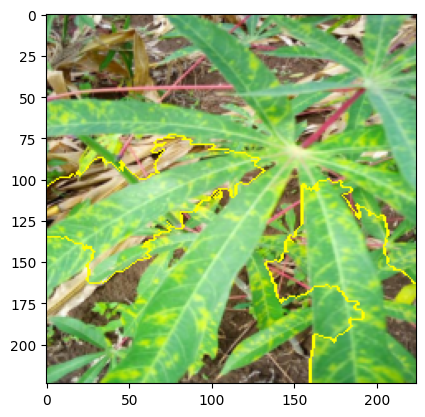

In [42]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
img_boundry1 = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry1)
plt.show()

Let's turn on areas that contributes against the top prediction.

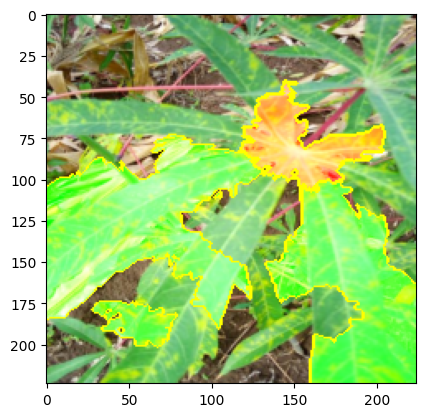

In [43]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
img_boundry2 = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry2)
plt.show()

Cassava Bacterial Blight (CBB)


  0%|          | 0/1000 [00:00<?, ?it/s]

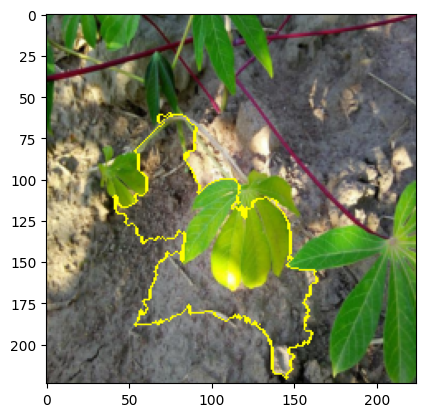

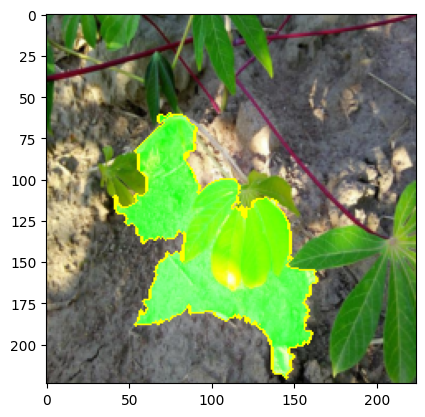

Cassava Brown Streak Disease (CBSD)


  0%|          | 0/1000 [00:00<?, ?it/s]

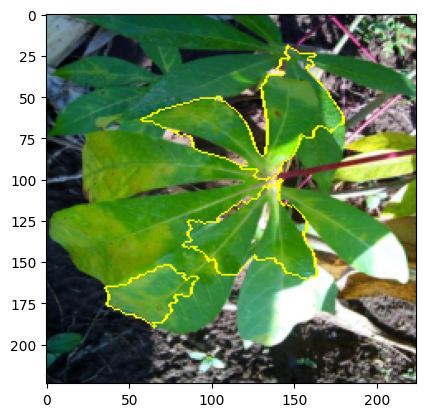

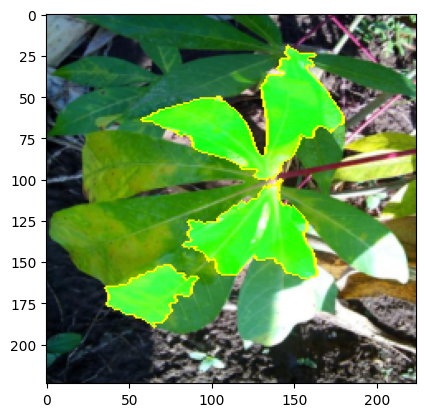

Cassava Green Mottle (CGM)


  0%|          | 0/1000 [00:00<?, ?it/s]

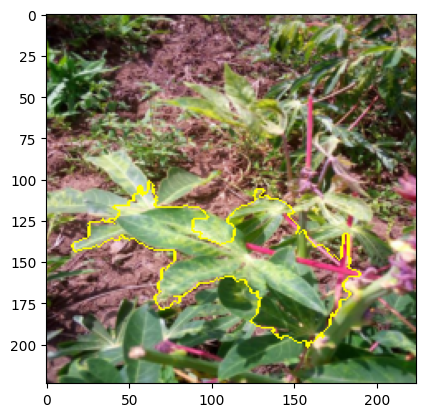

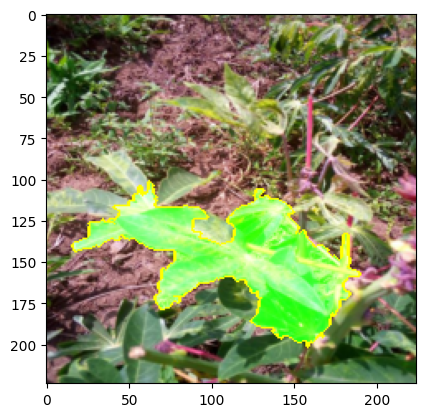

Cassava Mosaic Disease (CMD)


  0%|          | 0/1000 [00:00<?, ?it/s]

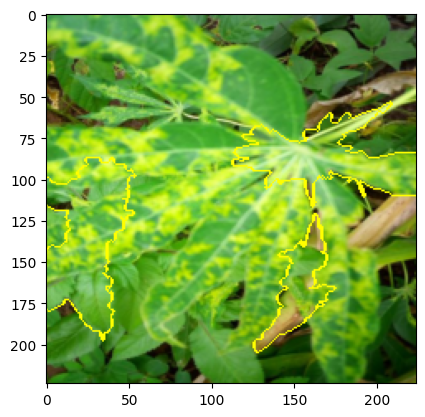

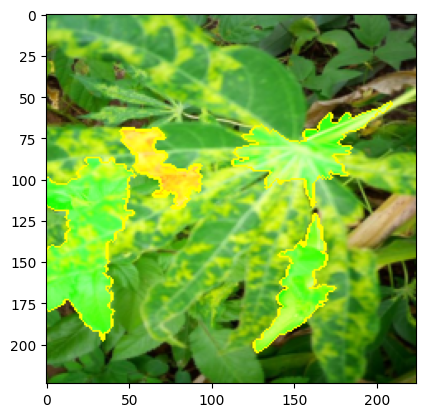

Healthy


  0%|          | 0/1000 [00:00<?, ?it/s]

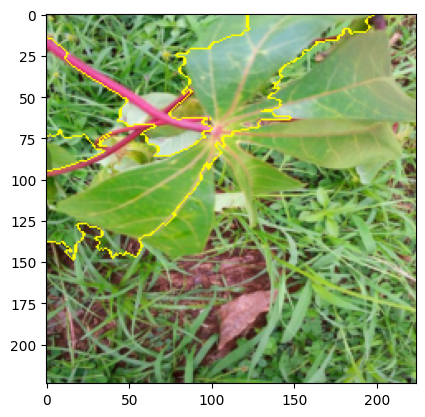

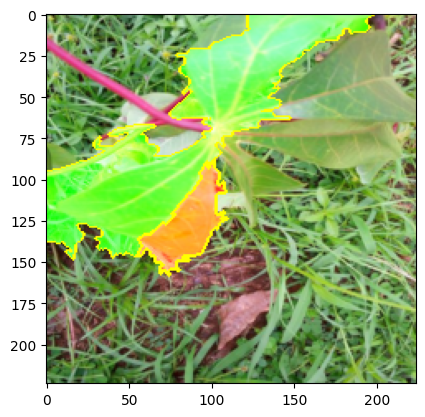

In [44]:
NUM_FEATURES = 5
for k, image in enumerate(unique_samples):
    print(label2cls[str(k)])
    img = get_image(f'./cassava/images/{image}')
    
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(np.array(pill_transf(img)), 
                                             batch_predict, # classification function
                                             top_labels=5, 
                                             hide_color=0, 
                                             num_samples=1000) # number of images that will be sent to classification function
    
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=NUM_FEATURES, hide_rest=False)
    img_boundry1 = mark_boundaries(temp/255.0, mask)
    plt.imshow(img_boundry1)
    plt.show()
    
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=NUM_FEATURES, hide_rest=False)
    img_boundry2 = mark_boundaries(temp/255.0, mask)
    plt.imshow(img_boundry2)
    plt.show()

In [58]:
# Get predictions for all test images
def get_all_predictions(model, dataloader, device='cpu'):
    """Get predictions and true labels for all images in dataloader"""
    model.eval()
    model.to(device)
    
    all_probs = []
    all_labels = []
    all_indices = []
    
    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(dataloader):
            images = images.to(device)
            logits = model(images)
            probs = F.softmax(logits, dim=1)
            
            all_probs.append(probs.cpu().numpy())
            all_labels.append(labels.numpy())
            all_indices.extend(range(batch_idx * dataloader.batch_size, 
                                    batch_idx * dataloader.batch_size + len(labels)))
    
    all_probs = np.vstack(all_probs)
    all_labels = np.concatenate(all_labels)
    
    return all_probs, all_labels, all_indices

In [59]:
# Get predictions for test set
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_probs, test_labels, test_indices = get_all_predictions(
    lightning_module.model, 
    data_module.test_dataloader(), 
    device
)

# Calculate confidence scores for correct predictions
predicted_classes = np.argmax(test_probs, axis=1)
correct_mask = predicted_classes == test_labels

# For each class, find best and worst classified images
best_images = {}
worst_images = {}

for class_idx in range(NUM_CLASSES):
    # Get indices for this class
    class_mask = test_labels == class_idx
    class_correct_mask = class_mask & correct_mask
    
    # Get confidence scores for this class
    class_confidences = test_probs[:, class_idx]
    
    # Best: Correct prediction with highest confidence
    if class_correct_mask.any():
        correct_confidences = class_confidences.copy()
        correct_confidences[~class_correct_mask] = -1
        best_idx = np.argmax(correct_confidences)
        best_images[class_idx] = {
            'dataset_idx': best_idx,
            'confidence': class_confidences[best_idx],
            'predicted': predicted_classes[best_idx],
            'true_label': test_labels[best_idx]
        }
    
    # Worst: Incorrect prediction OR correct with lowest confidence
    # First, try to find misclassified images
    class_incorrect_mask = class_mask & ~correct_mask
    if class_incorrect_mask.any():
        # Among misclassified, find the one with lowest confidence for true class
        incorrect_confidences = class_confidences.copy()
        incorrect_confidences[~class_incorrect_mask] = 2.0  # High value to exclude
        worst_idx = np.argmin(incorrect_confidences)
    else:
        # If all correct, take the one with lowest confidence
        correct_confidences = class_confidences.copy()
        correct_confidences[~class_correct_mask] = 2.0
        worst_idx = np.argmin(correct_confidences)
    
    worst_images[class_idx] = {
        'dataset_idx': worst_idx,
        'confidence': class_confidences[worst_idx],
        'predicted': predicted_classes[worst_idx],
        'true_label': test_labels[worst_idx]
    }


In [60]:
# Function to get image from test dataset
def get_test_image(dataset, idx):
    """Get PIL image from dataset at given index"""
    # Get the image tensor
    img_tensor, label = dataset[idx]
    
    # Convert tensor back to PIL image
    # Denormalize
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    img_tensor = img_tensor * std + mean
    img_tensor = torch.clamp(img_tensor, 0, 1)
    
    # Convert to PIL
    img_np = img_tensor.permute(1, 2, 0).numpy()
    img_pil = Image.fromarray((img_np * 255).astype(np.uint8))
    
    return img_pil, label

# Function to create LIME explanation
def create_lime_explanation(img, num_samples=1000):
    """Create LIME explanation for an image"""
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(
        np.array(pill_transf(img)), 
        batch_predict,
        top_labels=5, 
        hide_color=0, 
        num_samples=num_samples
    )
    return explanation

BEST CLASSIFIED IMAGES (with LIME explanations)

Class 0: Cassava Bacterial Blight (CBB)
True Label: 0, Predicted: 0, Confidence: 0.9997


  0%|          | 0/1000 [00:00<?, ?it/s]

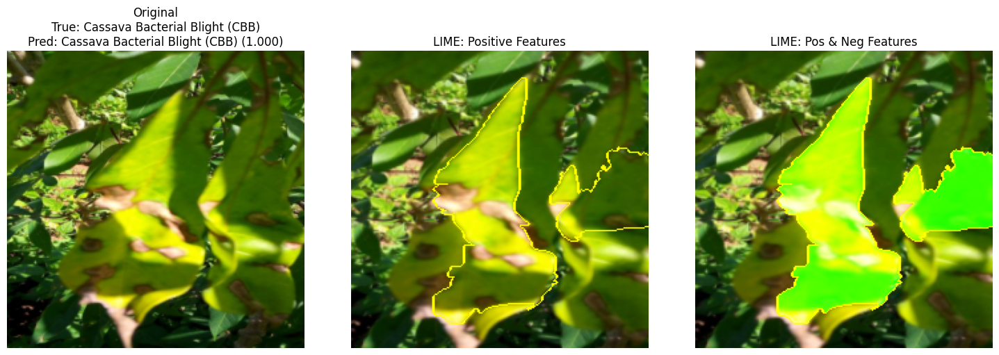


Class 1: Cassava Brown Streak Disease (CBSD)
True Label: 1, Predicted: 1, Confidence: 1.0000


  0%|          | 0/1000 [00:00<?, ?it/s]

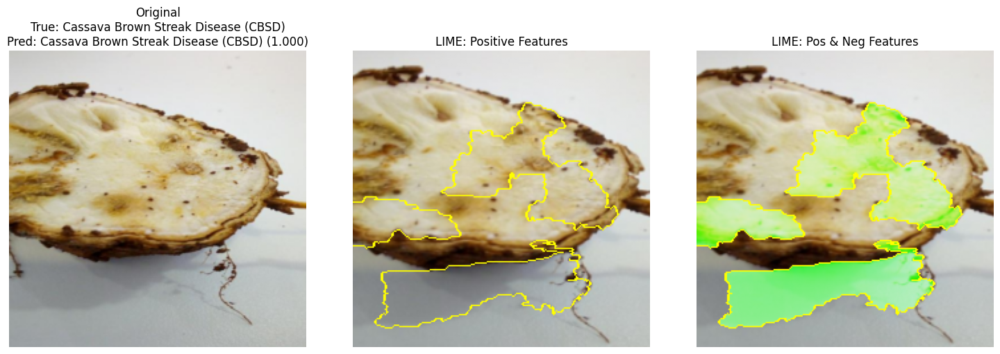


Class 2: Cassava Green Mottle (CGM)
True Label: 2, Predicted: 2, Confidence: 1.0000


  0%|          | 0/1000 [00:00<?, ?it/s]

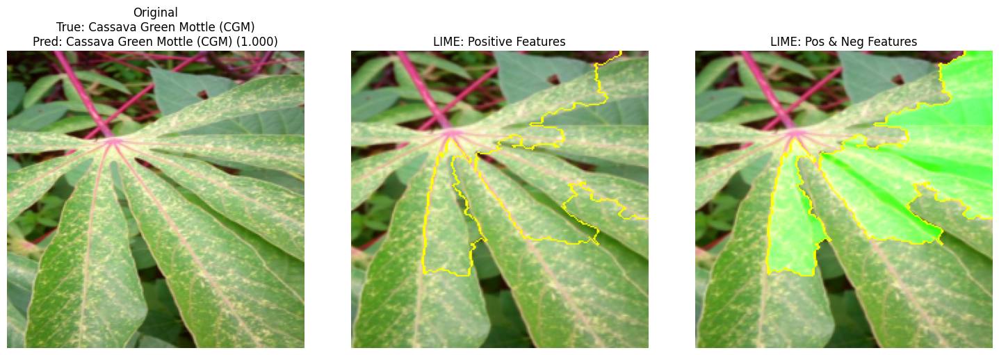


Class 3: Cassava Mosaic Disease (CMD)
True Label: 3, Predicted: 3, Confidence: 1.0000


  0%|          | 0/1000 [00:00<?, ?it/s]

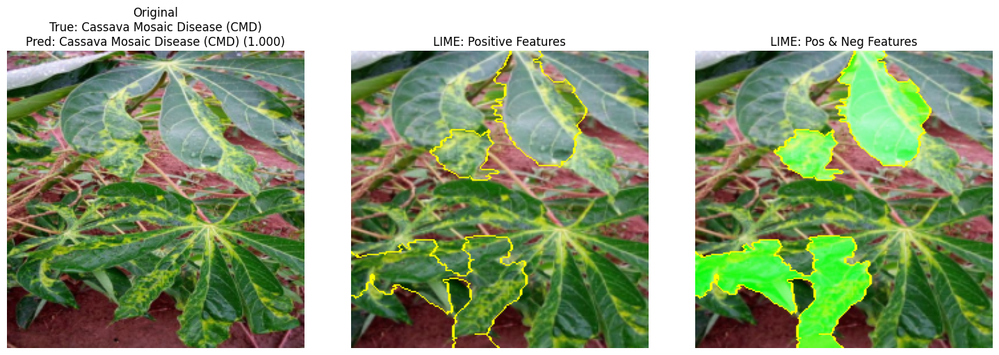


Class 4: Healthy
True Label: 4, Predicted: 4, Confidence: 0.9999


  0%|          | 0/1000 [00:00<?, ?it/s]

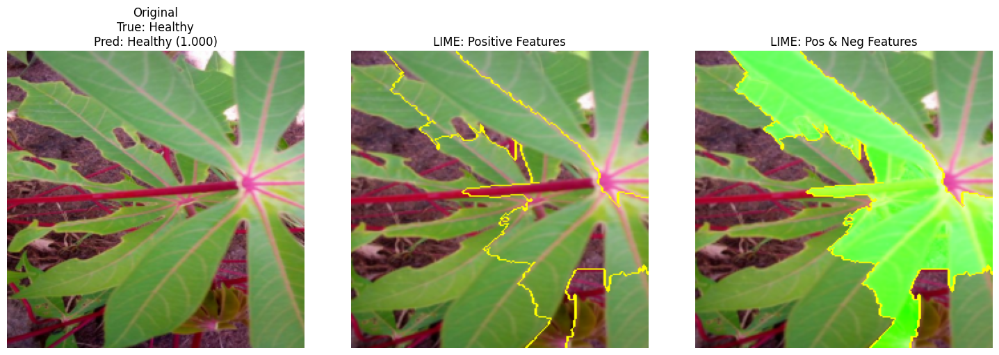


WORST CLASSIFIED IMAGES (with LIME explanations)

Class 0: Cassava Bacterial Blight (CBB)
True Label: 0, Predicted: 3, Confidence: 0.0006


  0%|          | 0/1000 [00:00<?, ?it/s]

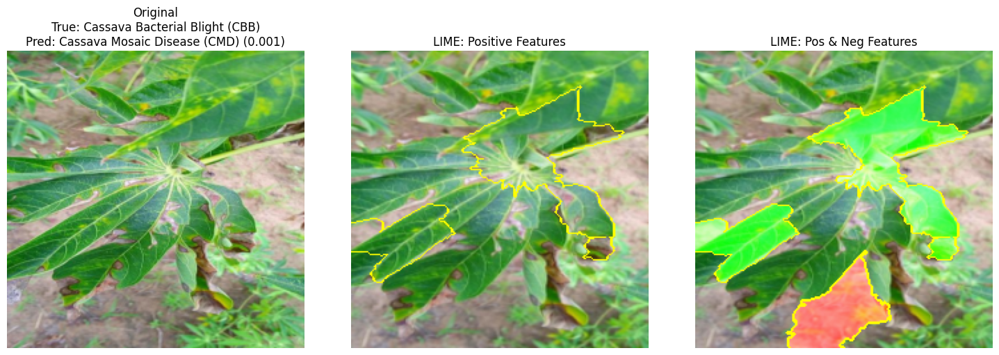


Class 1: Cassava Brown Streak Disease (CBSD)
True Label: 1, Predicted: 4, Confidence: 0.0001


  0%|          | 0/1000 [00:00<?, ?it/s]

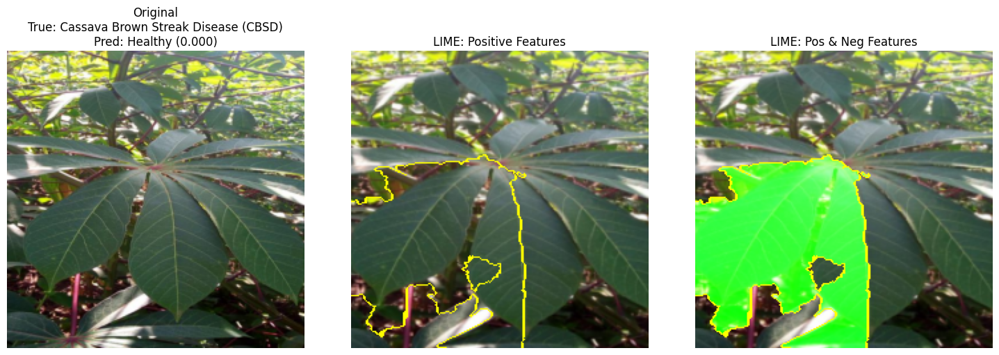


Class 2: Cassava Green Mottle (CGM)
True Label: 2, Predicted: 4, Confidence: 0.0002


  0%|          | 0/1000 [00:00<?, ?it/s]

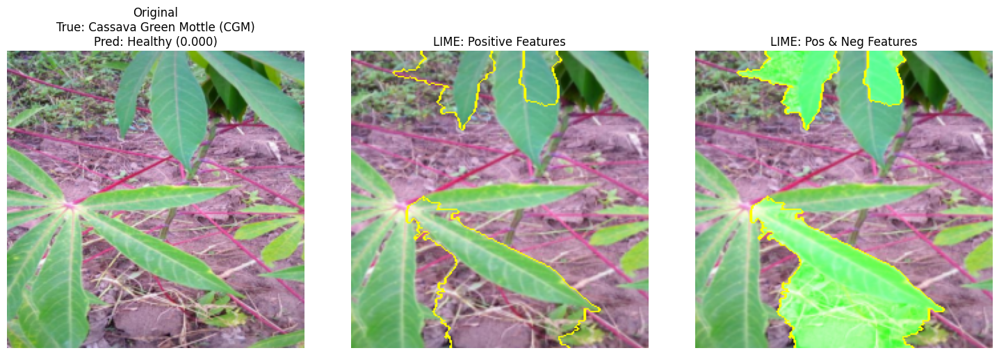


Class 3: Cassava Mosaic Disease (CMD)
True Label: 3, Predicted: 1, Confidence: 0.0000


  0%|          | 0/1000 [00:00<?, ?it/s]

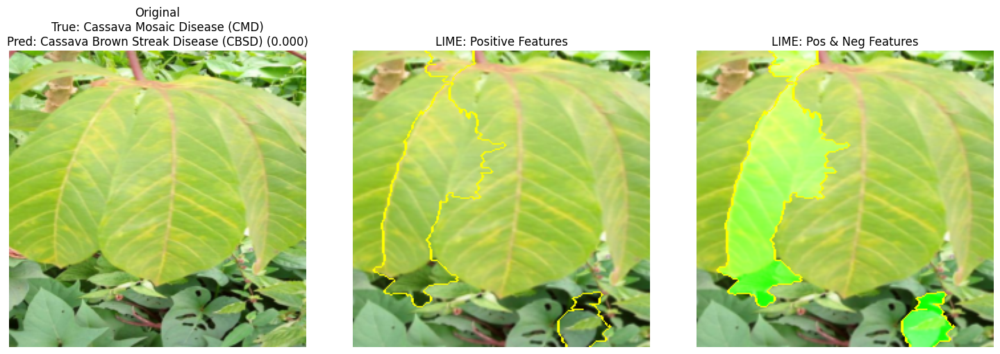


Class 4: Healthy
True Label: 4, Predicted: 3, Confidence: 0.0000


  0%|          | 0/1000 [00:00<?, ?it/s]

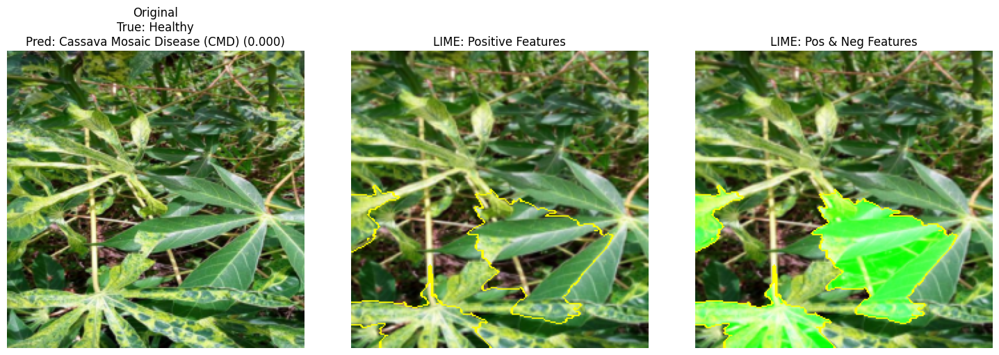


SUMMARY

Best Classifications:
Class 0 (Cassava Bacterial Blight (CBB)): Confidence = 0.9997
Class 1 (Cassava Brown Streak Disease (CBSD)): Confidence = 1.0000
Class 2 (Cassava Green Mottle (CGM)): Confidence = 1.0000
Class 3 (Cassava Mosaic Disease (CMD)): Confidence = 1.0000
Class 4 (Healthy): Confidence = 0.9999

Worst Classifications:
Class 0 (Cassava Bacterial Blight (CBB)): Confidence = 0.0006 ✗
Class 1 (Cassava Brown Streak Disease (CBSD)): Confidence = 0.0001 ✗
Class 2 (Cassava Green Mottle (CGM)): Confidence = 0.0002 ✗
Class 3 (Cassava Mosaic Disease (CMD)): Confidence = 0.0000 ✗
Class 4 (Healthy): Confidence = 0.0000 ✗


In [63]:
# Visualize best and worst with LIME explanations
NUM_FEATURES = 5

print("=" * 80)
print("BEST CLASSIFIED IMAGES (with LIME explanations)")
print("=" * 80)

for class_idx in range(NUM_CLASSES):
    if class_idx not in best_images:
        continue
    
    info = best_images[class_idx]
    img, label = get_test_image(data_module.test_ds, info['dataset_idx'])
    
    print(f"\nClass {class_idx}: {label2cls[str(class_idx)]}")
    print(f"True Label: {info['true_label']}, Predicted: {info['predicted']}, Confidence: {info['confidence']:.4f}")
    
    # Create figure with 3 subplots
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original image
    axes[0].imshow(img)
    axes[0].set_title(f"Original\nTrue: {label2cls[str(info['true_label'])]}\nPred: {label2cls[str(info['predicted'])]} ({info['confidence']:.3f})")
    axes[0].axis('off')
    
    # LIME explanation
    explanation = create_lime_explanation(img)
    
    # Positive features only
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0], 
        positive_only=True, 
        num_features=NUM_FEATURES, 
        hide_rest=False
    )
    img_boundry1 = mark_boundaries(temp/255.0, mask)
    axes[1].imshow(img_boundry1)
    axes[1].set_title("LIME: Positive Features")
    axes[1].axis('off')
    
    # Positive and negative features
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0], 
        positive_only=False, 
        num_features=NUM_FEATURES, 
        hide_rest=False
    )
    img_boundry2 = mark_boundaries(temp/255.0, mask)
    axes[2].imshow(img_boundry2)
    axes[2].set_title("LIME: Pos & Neg Features")
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.savefig(f'./figures/best_{class_idx}.pdf', dpi=80)
    plt.show()

print("\n" + "=" * 80)
print("WORST CLASSIFIED IMAGES (with LIME explanations)")
print("=" * 80)

for class_idx in range(NUM_CLASSES):
    if class_idx not in worst_images:
        continue
    
    info = worst_images[class_idx]
    img, label = get_test_image(data_module.test_ds, info['dataset_idx'])
    
    print(f"\nClass {class_idx}: {label2cls[str(class_idx)]}")
    print(f"True Label: {info['true_label']}, Predicted: {info['predicted']}, Confidence: {info['confidence']:.4f}")
    
    # Create figure with 3 subplots
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original image
    axes[0].imshow(img)
    axes[0].set_title(f"Original\nTrue: {label2cls[str(info['true_label'])]}\nPred: {label2cls[str(info['predicted'])]} ({info['confidence']:.3f})")
    axes[0].axis('off')
    
    # LIME explanation
    explanation = create_lime_explanation(img)
    
    # Positive features only
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0], 
        positive_only=True, 
        num_features=NUM_FEATURES, 
        hide_rest=False
    )
    img_boundry1 = mark_boundaries(temp/255.0, mask)
    axes[1].imshow(img_boundry1)
    axes[1].set_title("LIME: Positive Features")
    axes[1].axis('off')
    
    # Positive and negative features
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0], 
        positive_only=False, 
        num_features=NUM_FEATURES, 
        hide_rest=False
    )
    img_boundry2 = mark_boundaries(temp/255.0, mask)
    axes[2].imshow(img_boundry2)
    axes[2].set_title("LIME: Pos & Neg Features")
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.savefig(f'./figures/worst_{class_idx}.pdf', dpi=80)
    plt.show()

# Optional: Print summary statistics
print("\n" + "=" * 80)
print("SUMMARY")
print("=" * 80)
print("\nBest Classifications:")
for class_idx in range(NUM_CLASSES):
    if class_idx in best_images:
        info = best_images[class_idx]
        print(f"Class {class_idx} ({label2cls[str(class_idx)]}): Confidence = {info['confidence']:.4f}")

print("\nWorst Classifications:")
for class_idx in range(NUM_CLASSES):
    if class_idx in worst_images:
        info = worst_images[class_idx]
        correct = "✓" if info['predicted'] == info['true_label'] else "✗"
        print(f"Class {class_idx} ({label2cls[str(class_idx)]}): Confidence = {info['confidence']:.4f} {correct}")

# End of Notebook